In [1]:
# 1. Does home-field advantage exist?
# 2. Does weather have an effect on team performance in terms of average goals scored per game?
# 3. Does weather diminish home-field advantage?

In [48]:
import pandas as pd
import csv
import json
import requests
import numpy as np
import scipy
import statsmodels.api
import seaborn as sns
import sklearn.preprocessing as skp
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
from datetime import datetime
from datetime import timedelta

In [3]:
import mysql.connector
import config

In [4]:
pd.set_option('display.max_columns', 50)

In [5]:
cnx = mysql.connector.connect(
    host = config.host,
    user = config.user,
    passwd = config.pw,
    database = 'soccer_matches'
)
cursor = cnx.cursor()

In [6]:
# Read in soccer data from MySQL database

matches = pd.read_sql("select * from matches", cnx)
# matches['date'] = matches['datetime'].apply(lambda x: x.strftime('%Y-%m-%d'))
matches

,match_key,datetime,season,timestamp,date_GMT,status,attendance,home_team_name,away_team_name,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_goal_timings,away_team_goal_timings,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,stadium_name
0,AFC Bournemouth vs Arsenal 01-03-17,2017-01-03 19:45:00,2016,1483472700,Jan 3 2017 - 7:45pm,complete,11202,AFC Bournemouth,Arsenal,3,3,6,2,2,0,"16,20,58","70,75,90'2",4,7,3,1,3,0,13,14,7,5,6,9,9,9,45,55,Vitality Stadium
1,AFC Bournemouth vs Arsenal 01-14-18,2018-01-14 13:30:00,2017,1515936600,Jan 14 2018 - 1:30pm,complete,10836,AFC Bournemouth,Arsenal,2,1,3,0,0,0,"70,74",52,4,5,2,0,2,0,14,13,6,5,8,8,7,10,45,55,Vitality Stadium
2,AFC Bournemouth vs Arsenal 02-07-16,2016-02-07 13:30:00,2015,1454851800,Feb 7 2016 - 1:30pm,complete,11357,AFC Bournemouth,Arsenal,0,2,2,2,0,2,,"23,24",7,3,0,0,1,0,14,6,5,4,9,2,5,8,56,44,Vitality Stadium
3,AFC Bournemouth vs Arsenal 11-25-18,2018-11-25 13:30:00,2018,1543152600,Nov 25 2018 - 1:30pm,complete,10792,AFC Bournemouth,Arsenal,1,2,3,2,1,1,45'1,"30,67",5,8,2,0,1,0,12,21,6,5,6,16,6,11,43,57,Vitality Stadium
4,AFC Bournemouth vs Aston Villa 08-08-15,2015-08-08 14:00:00,2015,1439042400,Aug 8 2015 - 2:00pm,complete,11155,AFC Bournemouth,Aston Villa,0,1,1,0,0,0,,72,6,3,3,0,4,0,10,3,3,2,7,1,12,13,62,38,Vitality Stadium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3795,Wolverhampton Wanderers vs West Ham United 08-...,2009-08-15 14:00:00,2009,1250344800,Aug 15 2009 - 2:00pm,complete,28674,Wolverhampton Wanderers,West Ham United,0,2,2,1,0,1,,"22,69",-1,-1,0,0,0,0,-2,-2,-1,-1,-1,-1,-1,-1,-1,-1,Molineux Stadium
3796,Wolverhampton Wanderers vs West Ham United 10-...,2010-10-16 14:00:00,2010,1287237600,Oct 16 2010 - 2:00pm,complete,28582,Wolverhampton Wanderers,West Ham United,1,1,2,1,1,0,10,53,-1,-1,0,0,1,0,-2,-2,-1,-1,-1,-1,-1,-1,-1,-1,Molineux Stadium
3797,Wolverhampton Wanderers vs Wigan Athletic 01-1...,2010-01-16 15:00:00,2009,1263654000,Jan 16 2010 - 3:00pm,complete,27604,Wolverhampton Wanderers,Wigan Athletic,0,2,2,0,0,0,,"60,73",-1,-1,4,1,3,1,-2,-2,-1,-1,-1,-1,-1,-1,-1,-1,Molineux Stadium
3798,Wolverhampton Wanderers vs Wigan Athletic 11-0...,2011-11-06 13:30:00,2011,1320586200,Nov 6 2011 - 1:30pm,complete,23536,Wolverhampton Wanderers,Wigan Athletic,3,1,4,2,1,1,"31,55,66",42,-1,-1,2,0,1,0,-2,-2,-1,-1,-1,-1,-1,-1,-1,-1,Molineux Stadium


In [7]:
cnx.commit()

In [8]:
# https://github.com/jokecamp/FootballData/blob/master/other/stadiums-with-GPS-coordinates.csv
# (Lat, Long) for each English Premier League stadium

stadium_coordinates = {'Emirates Stadium': (51.555, -0.109), 'Villa Park': (52.509, -1.885),
                      'Ewood Park': (53.729, -2.489), 'Reebok Stadium': (53.581, -2.536),
                      'Stamford Bridge': (51.482, -0.191), 'Goodison Park': (53.439, -2.966),
                      'Craven Cottage': (51.475, -0.222), 'Anfield': (53.431, -2.961),
                      'Etihad Stadium': (53.483, -2.200), 'Old Trafford': (53.463, -2.291),
                      'Sports Direct Arena': (54.976, -1.622), 'Carrow Road': (52.622, 1.309),
                      'Loftus Road': (51.509, -0.232), 'Britannia Stadium': (52.988, -2.176),
                      'Stadium of Light': (54.914, -1.388), 'Liberty Stadium': (51.642, -3.935),
                      'White Hart Lane': (51.603, -0.066), 'The Hawthorns': (52.509, -1.964),
                      'DW Stadium': (53.548, -2.654), 'Molineux Stadium': (52.590, -2.130),
                      "St. Andrew's Stadium": (52.476, -1.868), 'Bloomfield Road': (53.805, -3.048),
                      'American Express Community Stadium': (50.862, -0.083), 'Turf Moor': (53.789, -2.230),
                      'Cardiff City Stadium': (51.473, -3.203), 'Selhurst Park': (51.398, -0.086),
                      'KC Stadium': (53.746, -0.368), 'King Power Stadium': (52.620, -1.142),
                      'Riverside Stadium': (54.578, -1.217), 'Fratton Park': (50.796, -1.064),
                      'Madejski Stadium': (51.422, -0.983), "St Mary's Stadium": (50.906, -1.391),
                      'Vicarage Road': (51.650, -0.401), 'Boleyn Ground': (51.532, 0.039),
                      'Bramall Lane': (53.370, -1.471), 'Dean Court': (50.735, -1.838),
                      "The John Smith's Stadium": (53.654, -1.768), 'Tottenham Hotspur Stadium' : (51.604, -0.066),
                      'Vitality Stadium': (50.735, -1.838), 'University of Bolton Stadium': (53.581, -2.537),
                      "St. James' Park": (54.976, -1.622), 'Kiyan Prince Foundation Stadium': (51.509, -0.232),
                      'Wembley Stadium': (51.556, -0.280), 'London Stadium': (51.539, 0.017)}

# print (len(stadium_coordinates))

In [9]:
# API call function

def get_data(match_key, parameters):  
    weather_dict = {}
    base_url = 'https://api.worldweatheronline.com/premium/v1/past-weather.ashx'
    response = requests.get(base_url, params=parameters)
    weather = response.json()
    weather_dict[match_key] = weather['data']['weather'][0]['hourly']
    return weather_dict

In [10]:
## Make API call with each soccer game in dataset, creating parameters for each

weather_data = []
for index, row in matches[matches['season'] == 2018].iterrows():
    parameters = {'q': (str(stadium_coordinates[row['stadium_name']][0]) + ',' + str(stadium_coordinates[row['stadium_name']][1])),
                  'date':  row['date'],
                  'includelocation': 'yes',
                  'tp': '1',
                  'format': 'json',
                  'key': 'c0a92f31f71d48808ee164935193112'}
    game = get_data(row['match_key'], parameters)
    weather_data.append(game)
weather_data

In [11]:
# Load saved data from API call

with open('weather_data.txt') as json_file:
    data = json.load(json_file)

In [12]:
data

{'AFC Bournemouth vs Arsenal 11-25-18': [{'time': '0',
   'tempC': '7',
   'tempF': '45',
   'windspeedMiles': '14',
   'windspeedKmph': '23',
   'winddirDegree': '59',
   'winddir16Point': 'ENE',
   'weatherCode': '122',
   'weatherIconUrl': [{'value': 'http://cdn.worldweatheronline.net/images/wsymbols01_png_64/wsymbol_0004_black_low_cloud.png'}],
   'weatherDesc': [{'value': 'Overcast'}],
   'precipMM': '0.0',
   'precipInches': '0.0',
   'humidity': '87',
   'visibility': '10',
   'visibilityMiles': '6',
   'pressure': '1009',
   'pressureInches': '30',
   'cloudcover': '100',
   'HeatIndexC': '7',
   'HeatIndexF': '45',
   'DewPointC': '5',
   'DewPointF': '42',
   'WindChillC': '4',
   'WindChillF': '39',
   'WindGustMiles': '20',
   'WindGustKmph': '32',
   'FeelsLikeC': '4',
   'FeelsLikeF': '39',
   'uvIndex': '1'},
  {'time': '100',
   'tempC': '7',
   'tempF': '45',
   'windspeedMiles': '14',
   'windspeedKmph': '23',
   'winddirDegree': '59',
   'winddir16Point': 'ENE',
   '

In [13]:
# Keep necessary values

values_list = []
for item in data:
    for thing in data[item]:
        thing['match_key'] = item
        thing['weatherDesc'] = thing['weatherDesc'][0]['value']
        values_list.append(thing)
values_list

[{'time': '0',
  'tempC': '7',
  'tempF': '45',
  'windspeedMiles': '14',
  'windspeedKmph': '23',
  'winddirDegree': '59',
  'winddir16Point': 'ENE',
  'weatherCode': '122',
  'weatherIconUrl': [{'value': 'http://cdn.worldweatheronline.net/images/wsymbols01_png_64/wsymbol_0004_black_low_cloud.png'}],
  'weatherDesc': 'Overcast',
  'precipMM': '0.0',
  'precipInches': '0.0',
  'humidity': '87',
  'visibility': '10',
  'visibilityMiles': '6',
  'pressure': '1009',
  'pressureInches': '30',
  'cloudcover': '100',
  'HeatIndexC': '7',
  'HeatIndexF': '45',
  'DewPointC': '5',
  'DewPointF': '42',
  'WindChillC': '4',
  'WindChillF': '39',
  'WindGustMiles': '20',
  'WindGustKmph': '32',
  'FeelsLikeC': '4',
  'FeelsLikeF': '39',
  'uvIndex': '1',
  'match_key': 'AFC Bournemouth vs Arsenal 11-25-18'},
 {'time': '100',
  'tempC': '7',
  'tempF': '45',
  'windspeedMiles': '14',
  'windspeedKmph': '23',
  'winddirDegree': '59',
  'winddir16Point': 'ENE',
  'weatherCode': '122',
  'weatherIcon

In [14]:
# Drop unwanted columns from dataframe

frame = pd.DataFrame(values_list)
frame = frame.drop(columns=['tempC', 'windspeedKmph', 'winddirDegree', 'winddir16Point', 'weatherIconUrl',
                           'precipInches', 'humidity', 'visibility', 'pressure', 'pressureInches', 'cloudcover',
                           'HeatIndexC', 'HeatIndexF', 'DewPointC', 'DewPointF', 'WindChillC', 'WindChillF',
                           'WindGustMiles', 'WindGustKmph', 'FeelsLikeC', 'FeelsLikeF', 'uvIndex'])
cols = frame.columns.tolist()
cols = cols[-1:] + cols[:-1]
frame = frame[cols]
frame = frame.astype({'time': 'int64'})
frame

,match_key,time,tempF,windspeedMiles,weatherCode,weatherDesc,precipMM,visibilityMiles
0,AFC Bournemouth vs Arsenal 11-25-18,0,45,14,122,Overcast,0.0,6
1,AFC Bournemouth vs Arsenal 11-25-18,100,45,14,122,Overcast,0.0,6
2,AFC Bournemouth vs Arsenal 11-25-18,200,45,15,122,Overcast,0.0,6
3,AFC Bournemouth vs Arsenal 11-25-18,300,45,15,122,Overcast,0.0,6
4,AFC Bournemouth vs Arsenal 11-25-18,400,45,15,122,Overcast,0.0,6
...,...,...,...,...,...,...,...,...
9115,Wolverhampton Wanderers vs West Ham United 01-...,1900,34,13,338,Heavy snow,1.2,2
9116,Wolverhampton Wanderers vs West Ham United 01-...,2000,33,13,323,Patchy light snow,0.0,4
9117,Wolverhampton Wanderers vs West Ham United 01-...,2100,33,12,323,Patchy light snow,0.0,6
9118,Wolverhampton Wanderers vs West Ham United 01-...,2200,32,12,323,Patchy light snow,0.0,6


In [ ]:
# cursor.execute("""DROP TABLE weather""")

In [ ]:
# Create weather table in MySQL database

create_query = """
CREATE TABLE weather
    (match_key varchar(150), time int, tempF int, windspeedMiles int, weatherCode int, 
    weatherDesc varchar(150), precipMM float, visibilityMiles int, PRIMARY KEY (match_key, time))
"""

In [ ]:
cursor.execute(create_query)

In [ ]:
cnx.commit()

In [ ]:
# Insert each row into database

def insert_to_table(df):
    global cnx, cursor
    debug = True
    # creating column list for insertion
    cols = ", ".join([str(i) for i in df.columns.tolist()])
    # Insert DataFrame records one by one.
    for i, row in df.iterrows():
        # Convert datetime obj to string
        sql = "INSERT INTO weather (" + cols + ") VALUES (" + "%s," * (len(row) - 1) + "%s)"
        if debug:
            print(sql)
            print(tuple(row))
        cursor.execute(sql, tuple(row))
        # the connection is not auto-committed by default, so we must commit to save our changes
        cnx.commit()

In [ ]:
insert_to_table(frame)

In [15]:
# Load in weather data from database

weather_df = pd.read_sql("SELECT * FROM weather", cnx)

In [16]:
weather_df

,match_key,time,tempF,windspeedMiles,weatherCode,weatherDesc,precipMM,visibilityMiles
0,AFC Bournemouth vs Arsenal 11-25-18,0,45,14,122,Overcast,0.0,6
1,AFC Bournemouth vs Arsenal 11-25-18,100,45,14,122,Overcast,0.0,6
2,AFC Bournemouth vs Arsenal 11-25-18,200,45,15,122,Overcast,0.0,6
3,AFC Bournemouth vs Arsenal 11-25-18,300,45,15,122,Overcast,0.0,6
4,AFC Bournemouth vs Arsenal 11-25-18,400,45,15,122,Overcast,0.0,6
...,...,...,...,...,...,...,...,...
9115,Wolverhampton Wanderers vs West Ham United 01-...,1900,34,13,338,Heavy snow,1.2,2
9116,Wolverhampton Wanderers vs West Ham United 01-...,2000,33,13,323,Patchy light snow,0.0,4
9117,Wolverhampton Wanderers vs West Ham United 01-...,2100,33,12,323,Patchy light snow,0.0,6
9118,Wolverhampton Wanderers vs West Ham United 01-...,2200,32,12,323,Patchy light snow,0.0,6


In [17]:
# Function to get time of game halftime and round to nearest hour

def get_hour(series):
    # Get the time of half time by adding 45 minutes
    dt = series['datetime'] +  timedelta(minutes = 45)
    # Round to nearest hour, times on the half hour round up
    if dt.minute >= 30:
        dt += timedelta(minutes = 30)
    return dt.hour *100

In [18]:
# Merge game and weather data into one dataframe

def get_weather_for_match_hour(match_df, weather_df, season):
    match_df['hour'] = match_df.apply(get_hour, axis=1)
    cols = list(match_df)
    cols.insert(2, cols.pop(cols.index('hour')))
    match_df = match_df.loc[:, cols]
    
    merged_df = pd.merge(match_df[match_df['season'] == season], weather_df, how='left', 
                         left_on=['match_key','hour'],
                        right_on=['match_key','time'])
    return merged_df

In [19]:
merged_df = get_weather_for_match_hour(matches, weather_df, 2018)
merged_df

,match_key,datetime,hour,season,timestamp,date_GMT,status,attendance,home_team_name,away_team_name,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_goal_timings,away_team_goal_timings,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,stadium_name,time,tempF,windspeedMiles,weatherCode,weatherDesc,precipMM,visibilityMiles
0,AFC Bournemouth vs Arsenal 11-25-18,2018-11-25 13:30:00,1400,2018,1543152600,Nov 25 2018 - 1:30pm,complete,10792,AFC Bournemouth,Arsenal,1,2,3,2,1,1,45'1,"30,67",5,8,2,0,1,0,12,21,6,5,6,16,6,11,43,57,Vitality Stadium,1400,47,16,122,Overcast,0.0,6
1,AFC Bournemouth vs Brighton & Hove Albion 12-2...,2018-12-22 15:00:00,1600,2018,1545490800,Dec 22 2018 - 3:00pm,complete,10491,AFC Bournemouth,Brighton & Hove Albion,2,0,2,1,1,0,"21,77",,6,5,2,0,1,1,15,10,4,5,11,5,7,17,52,48,Vitality Stadium,1600,51,14,116,Partly cloudy,0.0,6
2,AFC Bournemouth vs Burnley 04-06-19,2019-04-06 14:00:00,1500,2018,1554559200,Apr 6 2019 - 2:00pm,complete,10446,AFC Bournemouth,Burnley,1,3,4,3,1,2,4,"18,20,56",3,6,2,0,3,0,11,13,3,4,8,9,11,16,55,45,Vitality Stadium,1500,55,16,176,Patchy rain possible,0.0,6
3,AFC Bournemouth vs Cardiff City 08-11-18,2018-08-11 14:00:00,1500,2018,1533996000,Aug 11 2018 - 2:00pm,complete,10353,AFC Bournemouth,Cardiff City,2,0,2,1,1,0,"24,90'1",,7,4,1,0,1,0,9,11,4,2,5,9,11,7,62,38,Vitality Stadium,1500,63,15,266,Light drizzle,0.2,1
4,AFC Bournemouth vs Chelsea 01-30-19,2019-01-30 19:45:00,2100,2018,1548877500,Jan 30 2019 - 7:45pm,complete,10227,AFC Bournemouth,Chelsea,4,0,4,0,0,0,"47,63,74,90'5",,3,7,1,0,0,0,13,12,8,8,5,4,8,6,34,66,Vitality Stadium,2100,34,7,116,Partly cloudy,0.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,Wolverhampton Wanderers vs Newcastle United 02...,2019-02-11 20:00:00,2100,2018,1549915200,Feb 11 2019 - 8:00pm,complete,30687,Wolverhampton Wanderers,Newcastle United,1,1,2,0,0,0,90'5,56,13,1,1,0,3,0,24,10,8,4,16,6,7,9,58,42,Molineux Stadium,2100,42,5,116,Partly cloudy,0.0,12
376,Wolverhampton Wanderers vs Southampton 09-29-18,2018-09-29 14:00:00,1500,2018,1538229600,Sep 29 2018 - 2:00pm,complete,31147,Wolverhampton Wanderers,Southampton,2,0,2,0,0,0,"79,87",,8,6,3,0,1,0,17,18,7,7,10,11,11,6,52,48,Molineux Stadium,1500,59,8,113,Sunny,0.0,6
377,Wolverhampton Wanderers vs Tottenham Hotspur 1...,2018-11-03 19:45:00,2100,2018,1541274300,Nov 3 2018 - 7:45pm,complete,31185,Wolverhampton Wanderers,Tottenham Hotspur,2,3,5,2,0,2,"68,79","27,30,61",5,1,1,0,2,0,17,11,8,9,9,2,9,6,53,47,Molineux Stadium,2100,51,20,122,Overcast,0.0,6
378,Wolverhampton Wanderers vs Watford 10-20-18,2018-10-20 14:00:00,1500,2018,1540044000,Oct 20 2018 - 2:00pm,complete,31144,Wolverhampton Wanderers,Watford,0,2,2,2,0,2,,"20,21",8,2,3,0,1,0,11,10,2,4,9,6,22,13,45,55,Molineux Stadium,1500,61,7,116,Partly cloudy,0.0,6


In [20]:
# Create average shots on target column

merged_df['avg_shots_on_target'] = merged_df.apply(lambda row: ((row.home_team_shots_on_target + row.away_team_shots_on_target) / (row.home_team_shots + row.away_team_shots)), axis=1)
merged_df

,match_key,datetime,hour,season,timestamp,date_GMT,status,attendance,home_team_name,away_team_name,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_goal_timings,away_team_goal_timings,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,stadium_name,time,tempF,windspeedMiles,weatherCode,weatherDesc,precipMM,visibilityMiles,avg_shots_on_target
0,AFC Bournemouth vs Arsenal 11-25-18,2018-11-25 13:30:00,1400,2018,1543152600,Nov 25 2018 - 1:30pm,complete,10792,AFC Bournemouth,Arsenal,1,2,3,2,1,1,45'1,"30,67",5,8,2,0,1,0,12,21,6,5,6,16,6,11,43,57,Vitality Stadium,1400,47,16,122,Overcast,0.0,6,0.333333
1,AFC Bournemouth vs Brighton & Hove Albion 12-2...,2018-12-22 15:00:00,1600,2018,1545490800,Dec 22 2018 - 3:00pm,complete,10491,AFC Bournemouth,Brighton & Hove Albion,2,0,2,1,1,0,"21,77",,6,5,2,0,1,1,15,10,4,5,11,5,7,17,52,48,Vitality Stadium,1600,51,14,116,Partly cloudy,0.0,6,0.360000
2,AFC Bournemouth vs Burnley 04-06-19,2019-04-06 14:00:00,1500,2018,1554559200,Apr 6 2019 - 2:00pm,complete,10446,AFC Bournemouth,Burnley,1,3,4,3,1,2,4,"18,20,56",3,6,2,0,3,0,11,13,3,4,8,9,11,16,55,45,Vitality Stadium,1500,55,16,176,Patchy rain possible,0.0,6,0.291667
3,AFC Bournemouth vs Cardiff City 08-11-18,2018-08-11 14:00:00,1500,2018,1533996000,Aug 11 2018 - 2:00pm,complete,10353,AFC Bournemouth,Cardiff City,2,0,2,1,1,0,"24,90'1",,7,4,1,0,1,0,9,11,4,2,5,9,11,7,62,38,Vitality Stadium,1500,63,15,266,Light drizzle,0.2,1,0.300000
4,AFC Bournemouth vs Chelsea 01-30-19,2019-01-30 19:45:00,2100,2018,1548877500,Jan 30 2019 - 7:45pm,complete,10227,AFC Bournemouth,Chelsea,4,0,4,0,0,0,"47,63,74,90'5",,3,7,1,0,0,0,13,12,8,8,5,4,8,6,34,66,Vitality Stadium,2100,34,7,116,Partly cloudy,0.0,6,0.640000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,Wolverhampton Wanderers vs Newcastle United 02...,2019-02-11 20:00:00,2100,2018,1549915200,Feb 11 2019 - 8:00pm,complete,30687,Wolverhampton Wanderers,Newcastle United,1,1,2,0,0,0,90'5,56,13,1,1,0,3,0,24,10,8,4,16,6,7,9,58,42,Molineux Stadium,2100,42,5,116,Partly cloudy,0.0,12,0.352941
376,Wolverhampton Wanderers vs Southampton 09-29-18,2018-09-29 14:00:00,1500,2018,1538229600,Sep 29 2018 - 2:00pm,complete,31147,Wolverhampton Wanderers,Southampton,2,0,2,0,0,0,"79,87",,8,6,3,0,1,0,17,18,7,7,10,11,11,6,52,48,Molineux Stadium,1500,59,8,113,Sunny,0.0,6,0.400000
377,Wolverhampton Wanderers vs Tottenham Hotspur 1...,2018-11-03 19:45:00,2100,2018,1541274300,Nov 3 2018 - 7:45pm,complete,31185,Wolverhampton Wanderers,Tottenham Hotspur,2,3,5,2,0,2,"68,79","27,30,61",5,1,1,0,2,0,17,11,8,9,9,2,9,6,53,47,Molineux Stadium,2100,51,20,122,Overcast,0.0,6,0.607143
378,Wolverhampton Wanderers vs Watford 10-20-18,2018-10-20 14:00:00,1500,2018,1540044000,Oct 20 2018 - 2:00pm,complete,31144,Wolverhampton Wanderers,Watford,0,2,2,2,0,2,,"20,21",8,2,3,0,1,0,11,10,2,4,9,6,22,13,45,55,Molineux Stadium,1500,61,7,116,Partly cloudy,0.0,6,0.285714


In [21]:
merged_df['tempF'].describe()

count    380.000000
mean      51.484211
std        9.135871
min       27.000000
25%       46.000000
50%       51.000000
75%       56.000000
max       75.000000
Name: tempF, dtype: float64

In [22]:
cold_weather = merged_df[merged_df['tempF'] <= 50]
# cold_weather

In [23]:
hot_weather = merged_df[merged_df['tempF'] > 50]
# hot_weather

In [24]:
# Define criteria for 'bad weather'

bad_weather = ['Blizzard', 'Heavy rain', 'Light sleet', 'Light snow',
              'Light snow showers', 'Mist', 'Moderate or heavy rain with thunder',
              'Moderate rain', 'Moderate rain at times']

def bad_weather_matches():
    bad_weather_desc = merged_df[merged_df['weatherDesc'].isin(bad_weather)]
    bad_weather_matches = merged_df[(merged_df['precipMM'] >= 0.4) |
                                (merged_df['visibilityMiles'] < 1) |
                                (merged_df['tempF'] <= 32) | 
                                (merged_df['windspeedMiles'] >= 25)]
    bw_concat = pd.concat([bad_weather_desc, bad_weather_matches]).drop_duplicates().reset_index(drop=True)

    print(f"Lengths: bad_weather_desc: {len(bad_weather_desc)}, bad_weather_matches: {len(bad_weather_matches)}, bw_concat: {len(bw_concat)}" )
    return bw_concat

In [25]:
# Dataframe with only 'bad weather' matches

bad_weather = bad_weather_matches()
bad_weather

Lengths: bad_weather_desc: 20, bad_weather_matches: 27, bw_concat: 35


,match_key,datetime,hour,season,timestamp,date_GMT,status,attendance,home_team_name,away_team_name,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_goal_timings,away_team_goal_timings,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,stadium_name,time,tempF,windspeedMiles,weatherCode,weatherDesc,precipMM,visibilityMiles,avg_shots_on_target
0,Arsenal vs Cardiff City 01-29-19,2019-01-29 19:45:00,2100,2018,1548791100,Jan 29 2019 - 7:45pm,complete,59933,Arsenal,Cardiff City,2,1,3,0,0,0,"66,83",90'3,4,7,3,0,3,0,17,18,5,2,12,16,13,12,64,36,Emirates Stadium,2100,37,19,230,Blizzard,1.5,0,0.200000
1,Burnley vs Everton 12-26-18,2018-12-26 15:00:00,1600,2018,1545836400,Dec 26 2018 - 3:00pm,complete,21484,Burnley,Everton,1,5,6,4,1,3,36,"2,13,22,71,90'3",5,7,2,0,4,0,13,13,5,7,8,6,9,18,56,44,Turf Moor,1600,45,5,143,Mist,0.0,0,0.461538
2,Burnley vs Leicester City 03-16-19,2019-03-16 15:00:00,1600,2018,1552748400,Mar 16 2019 - 3:00pm,complete,20719,Burnley,Leicester City,1,2,3,2,1,1,38,"33,90",9,3,1,0,1,1,13,11,3,5,10,6,9,9,58,42,Turf Moor,1600,48,23,308,Heavy rain,2.0,3,0.333333
3,Chelsea vs West Ham United 04-08-19,2019-04-08 19:00:00,2000,2018,1554750000,Apr 8 2019 - 7:00pm,complete,40537,Chelsea,West Ham United,2,0,2,1,1,0,"24,90",,7,4,2,0,1,0,17,10,8,3,9,7,8,7,51,49,Stamford Bridge,2000,56,2,389,Moderate or heavy rain with thunder,0.3,4,0.407407
4,Crystal Palace vs Newcastle United 09-22-18,2018-09-22 14:00:00,1500,2018,1537624800,Sep 22 2018 - 2:00pm,complete,25679,Crystal Palace,Newcastle United,0,0,0,0,0,0,,,9,5,1,0,1,0,16,7,5,4,11,3,8,11,62,38,Selhurst Park,1500,52,5,302,Moderate rain,1.9,4,0.391304
5,Crystal Palace vs Wolverhampton Wanderers 10-0...,2018-10-06 14:00:00,1500,2018,1538834400,Oct 6 2018 - 2:00pm,complete,25715,Crystal Palace,Wolverhampton Wanderers,0,1,1,0,0,0,,56,6,3,3,0,4,0,14,8,6,3,8,5,11,13,64,36,Selhurst Park,1500,50,16,302,Moderate rain,2.1,4,0.409091
6,Everton vs Liverpool 03-03-19,2019-03-03 16:15:00,1700,2018,1551629700,Mar 3 2019 - 4:15pm,complete,39335,Everton,Liverpool,0,0,0,0,0,0,,,3,7,1,0,2,0,8,11,4,4,4,7,12,10,47,53,Goodison Park,1700,47,14,302,Moderate rain,1.2,4,0.421053
7,Fulham vs Brighton & Hove Albion 01-29-19,2019-01-29 19:45:00,2100,2018,1548791100,Jan 29 2019 - 7:45pm,complete,22008,Fulham,Brighton & Hove Albion,4,2,6,2,0,2,"47,58,74,79","3,17",10,1,2,0,3,0,24,17,9,8,15,9,11,5,58,42,Craven Cottage,2100,37,19,230,Blizzard,1.5,0,0.414634
8,Fulham vs Burnley 08-26-18,2018-08-26 15:00:00,1600,2018,1535295600,Aug 26 2018 - 3:00pm,complete,23438,Fulham,Burnley,4,2,6,5,3,2,"4,36,38,83","10,41",6,4,2,0,1,0,23,11,13,3,10,8,11,8,61,39,Craven Cottage,1600,61,16,302,Moderate rain,1.0,4,0.470588
9,Huddersfield Town vs Everton 01-29-19,2019-01-29 19:45:00,2100,2018,1548791100,Jan 29 2019 - 7:45pm,complete,23699,Huddersfield Town,Everton,0,1,1,1,0,1,,3,3,4,1,0,4,1,11,11,3,6,8,5,13,10,59,41,The John Smith's Stadium,2100,33,10,326,Light snow,0.0,6,0.409091


In [26]:
weather1 = merged_df.set_index('match_key')
badweather1 = bad_weather.set_index('match_key')

In [27]:
# Dataframe with only 'good weather' matches

good_weather = weather1[~(weather1.isin(badweather1).all(axis=1))]
good_weather

,datetime,hour,season,timestamp,date_GMT,status,attendance,home_team_name,away_team_name,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_goal_timings,away_team_goal_timings,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,stadium_name,time,tempF,windspeedMiles,weatherCode,weatherDesc,precipMM,visibilityMiles,avg_shots_on_target
match_key,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AFC Bournemouth vs Arsenal 11-25-18,2018-11-25 13:30:00,1400,2018,1543152600,Nov 25 2018 - 1:30pm,complete,10792,AFC Bournemouth,Arsenal,1,2,3,2,1,1,45'1,"30,67",5,8,2,0,1,0,12,21,6,5,6,16,6,11,43,57,Vitality Stadium,1400,47,16,122,Overcast,0.0,6,0.333333
AFC Bournemouth vs Brighton & Hove Albion 12-22-18,2018-12-22 15:00:00,1600,2018,1545490800,Dec 22 2018 - 3:00pm,complete,10491,AFC Bournemouth,Brighton & Hove Albion,2,0,2,1,1,0,"21,77",,6,5,2,0,1,1,15,10,4,5,11,5,7,17,52,48,Vitality Stadium,1600,51,14,116,Partly cloudy,0.0,6,0.360000
AFC Bournemouth vs Burnley 04-06-19,2019-04-06 14:00:00,1500,2018,1554559200,Apr 6 2019 - 2:00pm,complete,10446,AFC Bournemouth,Burnley,1,3,4,3,1,2,4,"18,20,56",3,6,2,0,3,0,11,13,3,4,8,9,11,16,55,45,Vitality Stadium,1500,55,16,176,Patchy rain possible,0.0,6,0.291667
AFC Bournemouth vs Cardiff City 08-11-18,2018-08-11 14:00:00,1500,2018,1533996000,Aug 11 2018 - 2:00pm,complete,10353,AFC Bournemouth,Cardiff City,2,0,2,1,1,0,"24,90'1",,7,4,1,0,1,0,9,11,4,2,5,9,11,7,62,38,Vitality Stadium,1500,63,15,266,Light drizzle,0.2,1,0.300000
AFC Bournemouth vs Chelsea 01-30-19,2019-01-30 19:45:00,2100,2018,1548877500,Jan 30 2019 - 7:45pm,complete,10227,AFC Bournemouth,Chelsea,4,0,4,0,0,0,"47,63,74,90'5",,3,7,1,0,0,0,13,12,8,8,5,4,8,6,34,66,Vitality Stadium,2100,34,7,116,Partly cloudy,0.0,6,0.640000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wolverhampton Wanderers vs Newcastle United 02-11-19,2019-02-11 20:00:00,2100,2018,1549915200,Feb 11 2019 - 8:00pm,complete,30687,Wolverhampton Wanderers,Newcastle United,1,1,2,0,0,0,90'5,56,13,1,1,0,3,0,24,10,8,4,16,6,7,9,58,42,Molineux Stadium,2100,42,5,116,Partly cloudy,0.0,12,0.352941
Wolverhampton Wanderers vs Southampton 09-29-18,2018-09-29 14:00:00,1500,2018,1538229600,Sep 29 2018 - 2:00pm,complete,31147,Wolverhampton Wanderers,Southampton,2,0,2,0,0,0,"79,87",,8,6,3,0,1,0,17,18,7,7,10,11,11,6,52,48,Molineux Stadium,1500,59,8,113,Sunny,0.0,6,0.400000
Wolverhampton Wanderers vs Tottenham Hotspur 11-03-18,2018-11-03 19:45:00,2100,2018,1541274300,Nov 3 2018 - 7:45pm,complete,31185,Wolverhampton Wanderers,Tottenham Hotspur,2,3,5,2,0,2,"68,79","27,30,61",5,1,1,0,2,0,17,11,8,9,9,2,9,6,53,47,Molineux Stadium,2100,51,20,122,Overcast,0.0,6,0.607143


In [28]:
# h0: There is no difference between in mean total goals between bad weather and good weather matches
# h1: There are less mean goals scored in bad weather matches than good weather matches

In [45]:
bad_weather.describe()

,hour,season,timestamp,attendance,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,time,tempF,windspeedMiles,weatherCode,precipMM,visibilityMiles,avg_shots_on_target
count,35.000000,35.0,3.500000e+01,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.00000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1740.000000,2018.0,1.546380e+09,35789.571429,1.657143,1.371429,3.028571,1.342857,0.714286,0.628571,5.828571,3.914286,1.828571,0.057143,1.942857,0.114286,14.885714,11.000000,6.085714,4.285714,8.80000,6.714286,9.857143,9.657143,54.457143,45.542857,1740.000000,45.171429,15.657143,254.685714,0.517143,4.257143,0.403823
std,258.046963,0.0,4.885609e+06,18462.671034,1.349136,1.139807,1.740279,1.258918,0.987314,0.770245,2.994954,2.489642,0.984758,0.235504,1.282068,0.322803,5.200517,3.903241,2.704804,1.758533,3.85624,3.722518,2.860922,3.395004,10.480634,10.480634,258.046963,7.338399,9.346100,86.193275,0.646022,2.512824,0.111156
min,1300.000000,2018.0,1.535296e+09,10625.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,3.000000,3.000000,0.000000,2.00000,1.000000,4.000000,3.000000,30.000000,24.000000,1300.000000,27.000000,2.000000,113.000000,0.000000,0.000000,0.166667
25%,1600.000000,2018.0,1.544156e+09,23568.500000,1.000000,1.000000,2.000000,1.000000,0.000000,0.000000,4.000000,3.000000,1.000000,0.000000,1.000000,0.000000,11.000000,8.000000,4.000000,3.000000,6.00000,4.500000,8.000000,7.000000,47.000000,38.000000,1600.000000,40.500000,8.000000,159.500000,0.000000,3.000000,0.333333
50%,1600.000000,2018.0,1.545836e+09,30553.000000,1.000000,1.000000,3.000000,1.000000,0.000000,0.000000,6.000000,4.000000,2.000000,0.000000,2.000000,0.000000,14.000000,11.000000,5.000000,4.000000,8.00000,6.000000,10.000000,10.000000,56.000000,44.000000,1600.000000,47.000000,16.000000,296.000000,0.300000,5.000000,0.409091
75%,2100.000000,2018.0,1.549258e+09,45776.500000,2.500000,2.000000,4.000000,2.000000,1.000000,1.000000,7.000000,5.500000,2.000000,0.000000,3.000000,0.000000,17.000000,13.000000,7.500000,5.000000,10.50000,8.000000,11.000000,12.000000,62.000000,53.000000,2100.000000,50.000000,23.500000,302.000000,0.700000,6.000000,0.466063
max,2100.000000,2018.0,1.556383e+09,74556.000000,4.000000,5.000000,6.000000,5.000000,3.000000,3.000000,13.000000,10.000000,4.000000,1.000000,4.000000,1.000000,28.000000,20.000000,13.000000,8.000000,18.00000,16.000000,18.000000,18.000000,76.000000,70.000000,2100.000000,61.000000,33.000000,389.000000,2.100000,11.000000,0.684211


In [46]:
good_weather.describe()

,hour,season,timestamp,attendance,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,time,tempF,windspeedMiles,weatherCode,precipMM,visibilityMiles,avg_shots_on_target
count,345.000000,345.0,3.450000e+02,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000,345.000000
mean,1637.971014,2018.0,1.546121e+09,37366.773913,1.559420,1.240580,2.800000,1.243478,0.675362,0.568116,5.715942,4.620290,1.515942,0.046377,1.692754,0.072464,15.136232,12.257971,5.805797,5.011594,9.330435,7.246377,9.881159,9.973913,51.214493,48.785507,1637.971014,52.124638,10.469565,150.321739,0.021159,5.965217,0.396901
std,249.141431,0.0,7.053007e+06,17465.503228,1.310769,1.184974,1.587744,1.132947,0.848461,0.767526,3.032845,2.749872,1.248444,0.210605,1.200087,0.270596,5.867381,4.763000,2.689335,2.409980,4.410720,3.591033,3.292931,3.423060,10.818821,10.818821,249.141431,9.064632,5.359715,69.301735,0.059444,1.608103,0.097903
min,1200.000000,2018.0,1.533928e+09,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,23.000000,22.000000,1200.000000,33.000000,1.000000,113.000000,0.000000,1.000000,0.090909
25%,1500.000000,2018.0,1.540649e+09,24979.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,4.000000,2.000000,1.000000,0.000000,1.000000,0.000000,11.000000,9.000000,4.000000,3.000000,6.000000,5.000000,8.000000,8.000000,43.000000,41.000000,1500.000000,46.000000,6.000000,116.000000,0.000000,6.000000,0.333333
50%,1600.000000,2018.0,1.546096e+09,31939.000000,1.000000,1.000000,3.000000,1.000000,0.000000,0.000000,5.000000,4.000000,1.000000,0.000000,2.000000,0.000000,14.000000,12.000000,6.000000,5.000000,9.000000,7.000000,10.000000,10.000000,52.000000,48.000000,1600.000000,51.000000,10.000000,119.000000,0.000000,6.000000,0.392857
75%,1700.000000,2018.0,1.551614e+09,53249.000000,2.000000,2.000000,4.000000,2.000000,1.000000,1.000000,8.000000,6.000000,2.000000,0.000000,2.000000,0.000000,19.000000,15.000000,7.000000,7.000000,12.000000,9.000000,12.000000,12.000000,59.000000,57.000000,1700.000000,57.000000,13.000000,122.000000,0.000000,6.000000,0.459459
max,2100.000000,2018.0,1.557670e+09,81332.000000,6.000000,6.000000,8.000000,6.000000,4.000000,3.000000,17.000000,14.000000,6.000000,1.000000,5.000000,2.000000,37.000000,26.000000,15.000000,13.000000,25.000000,19.000000,22.000000,20.000000,78.000000,77.000000,2100.000000,75.000000,24.000000,353.000000,0.300000,12.000000,0.708333


In [31]:
# Two-sample, one-sided t-test to see if weather is statistically significant on total goals scored

scipy.stats.ttest_ind(good_weather['total_goal_count'], bad_weather['total_goal_count'], equal_var=False)

Ttest_indResult(statistic=-0.7461624096942753, pvalue=0.4599370400924664)

In [51]:
statsmodels.stats.weightstats.ttest_ind(good_weather['total_goal_count'], bad_weather['total_goal_count'],
                                       alternative = 'smaller', usevar = 'unequal')

(-0.7461624096942753, 0.2299685200462332, 39.956522850836336)

In [32]:
# See if temperature is statistically significant

scipy.stats.ttest_ind(hot_weather['total_goal_count'], cold_weather['total_goal_count'], equal_var=False)

Ttest_indResult(statistic=-0.9159912484282927, pvalue=0.3602554777361182)

In [33]:
scipy.stats.ttest_ind(good_weather['avg_shots_on_target'], bad_weather['avg_shots_on_target'], equal_var=False)

Ttest_indResult(statistic=-0.35469055385402654, pvalue=0.7247063836099702)

In [34]:
# Check any possible correlations

corr = merged_df.corr()
corr

,hour,season,timestamp,attendance,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,time,tempF,windspeedMiles,weatherCode,precipMM,visibilityMiles,avg_shots_on_target
hour,1.000000,NaN,0.164970,0.084927,0.050119,-0.002200,0.039468,0.062892,0.048520,0.039330,0.007030,-0.041482,-0.071801,0.007272,0.022724,-0.048511,0.016031,-0.022462,0.047757,-0.079469,-0.008108,0.022871,-0.061393,-0.198753,0.006952,-0.006952,1.000000,-0.389168,-0.241135,0.012461,0.043968,-0.103021,-0.015176
season,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timestamp,0.164970,NaN,1.000000,-0.003229,0.020837,-0.026251,-0.002262,-0.055280,-0.038718,-0.038979,0.053267,-0.032867,-0.031369,-0.090831,-0.032639,-0.035408,0.036165,0.059939,0.009807,-0.064548,0.042084,0.120606,-0.190256,-0.135902,-0.018414,0.018414,0.164970,-0.298167,0.036762,0.167869,-0.014700,0.123524,-0.122670
attendance,0.084927,NaN,-0.003229,1.000000,0.238517,-0.114809,0.110943,0.035683,0.129521,-0.092158,0.146651,-0.115443,-0.118579,-0.082401,-0.045403,-0.092571,0.194349,-0.202428,0.296474,-0.064632,0.075865,-0.221726,-0.023556,0.005416,0.298606,-0.298606,0.084927,0.039495,-0.196574,-0.092063,-0.073937,0.002726,0.225163
home_team_goal_count,0.050119,NaN,0.020837,0.238517,1.000000,-0.178097,0.688608,0.469951,0.694242,-0.078393,0.084437,-0.135335,-0.115578,-0.058880,-0.039273,0.003761,0.324346,-0.190155,0.587132,-0.210805,0.069677,-0.109726,-0.043786,-0.079434,0.220977,-0.220977,0.050119,-0.045887,-0.023605,0.057328,0.002128,-0.098960,0.240695
away_team_goal_count,-0.002200,NaN,-0.026251,-0.114809,-0.178097,1.000000,0.590902,0.378785,-0.109562,0.687816,-0.143166,0.035768,0.157777,0.172951,0.026434,-0.051326,-0.161385,0.297504,-0.155390,0.542973,-0.118976,0.031695,0.045117,-0.022047,-0.216511,0.216511,-0.002200,0.011385,0.007456,-0.000078,-0.009185,-0.035931,0.249815
total_goal_count,0.039468,NaN,-0.002262,0.110943,0.688608,0.590902,1.000000,0.664422,0.488437,0.442591,-0.036275,-0.084597,0.021512,0.079177,-0.012718,-0.034739,0.146988,0.063336,0.366851,0.227297,-0.030551,-0.066602,-0.002651,-0.081371,0.021618,-0.021618,0.039468,-0.029231,-0.013858,0.046943,-0.005024,-0.107611,0.381426
total_goals_at_half_time,0.062892,NaN,-0.055280,0.035683,0.469951,0.378785,0.664422,1.000000,0.741901,0.658532,-0.107302,-0.039109,-0.000553,0.091678,0.048277,0.014010,0.062467,0.066931,0.230983,0.152473,-0.059270,-0.012777,0.019594,0.025185,-0.027360,0.027360,0.062892,0.007706,-0.037574,0.040244,0.012891,-0.131838,0.246048
home_team_goal_count_half_time,0.048520,NaN,-0.038718,0.129521,0.694242,-0.109562,0.488437,0.741901,1.000000,-0.016028,-0.062192,-0.022732,-0.108617,0.011225,0.028733,0.003454,0.132470,-0.064996,0.350543,-0.127976,-0.039818,-0.000784,-0.029000,0.020862,0.066489,-0.066489,0.048520,0.007741,-0.093488,0.001152,0.013061,-0.128387,0.151636
away_team_goal_count_half_time,0.039330,NaN,-0.038979,-0.092158,-0.078393,0.687816,0.442591,0.658532,-0.016028,1.000000,-0.090209,-0.032805,0.121082,0.124112,0.039742,0.017016,-0.055527,0.172757,-0.048991,0.371004,-0.043694,-0.018174,0.061767,0.014142,-0.115424,0.115424,0.039330,0.002802,0.048896,0.058719,0.004564,-0.052502,0.196719


In [36]:
# Create new dataframe for heatmap purposes

heat_df = merged_df.drop(columns=['match_key', 'datetime', 'hour', 'season', 'timestamp', 'date_GMT', 'status',
                                 'home_team_name', 'away_team_name', 'home_team_goal_timings', 'away_team_goal_timings',
                                 'stadium_name', 'time', 'weatherCode', 'weatherDesc'])

In [37]:
heat_df

,attendance,home_team_goal_count,away_team_goal_count,total_goal_count,total_goals_at_half_time,home_team_goal_count_half_time,away_team_goal_count_half_time,home_team_corner_count,away_team_corner_count,home_team_yellow_cards,home_team_red_cards,away_team_yellow_cards,away_team_red_cards,home_team_shots,away_team_shots,home_team_shots_on_target,away_team_shots_on_target,home_team_shots_off_target,away_team_shots_off_target,home_team_fouls,away_team_fouls,home_team_possession,away_team_possession,tempF,windspeedMiles,precipMM,visibilityMiles,avg_shots_on_target
0,10792,1,2,3,2,1,1,5,8,2,0,1,0,12,21,6,5,6,16,6,11,43,57,47,16,0.0,6,0.333333
1,10491,2,0,2,1,1,0,6,5,2,0,1,1,15,10,4,5,11,5,7,17,52,48,51,14,0.0,6,0.360000
2,10446,1,3,4,3,1,2,3,6,2,0,3,0,11,13,3,4,8,9,11,16,55,45,55,16,0.0,6,0.291667
3,10353,2,0,2,1,1,0,7,4,1,0,1,0,9,11,4,2,5,9,11,7,62,38,63,15,0.2,1,0.300000
4,10227,4,0,4,0,0,0,3,7,1,0,0,0,13,12,8,8,5,4,8,6,34,66,34,7,0.0,6,0.640000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,30687,1,1,2,0,0,0,13,1,1,0,3,0,24,10,8,4,16,6,7,9,58,42,42,5,0.0,12,0.352941
376,31147,2,0,2,0,0,0,8,6,3,0,1,0,17,18,7,7,10,11,11,6,52,48,59,8,0.0,6,0.400000
377,31185,2,3,5,2,0,2,5,1,1,0,2,0,17,11,8,9,9,2,9,6,53,47,51,20,0.0,6,0.607143
378,31144,0,2,2,2,0,2,8,2,3,0,1,0,11,10,2,4,9,6,22,13,45,55,61,7,0.0,6,0.285714


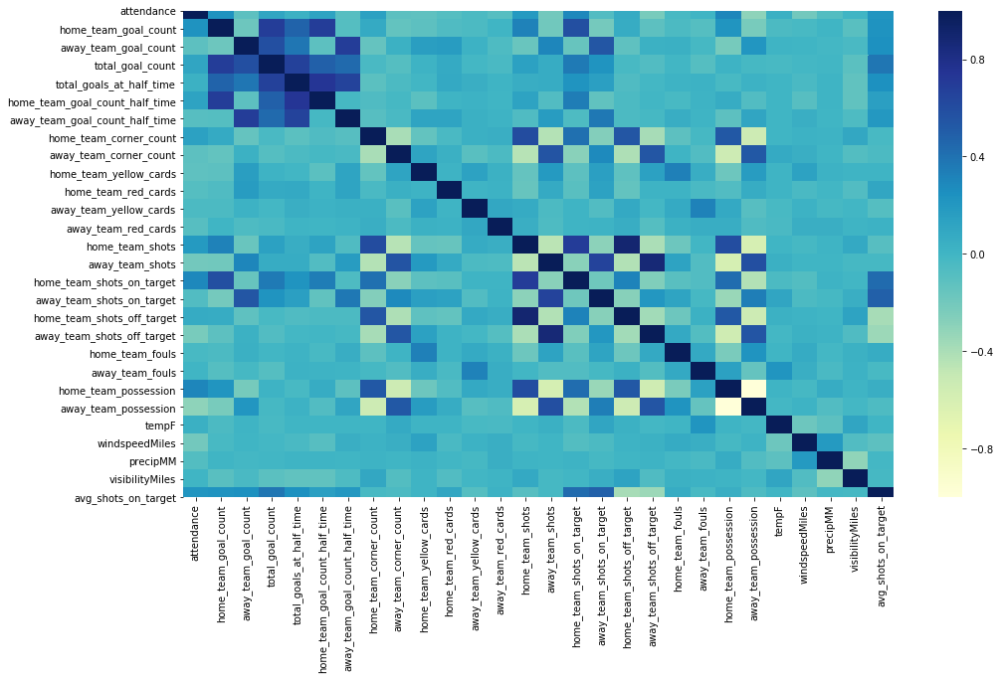

In [38]:
fig, ax = plt.subplots(figsize=(16,9))  
sns.heatmap(heat_df.corr(), cmap='YlGnBu')

In [43]:
# Function that plots distributions of total goals in good vs. bad weather

def plot_statistic(x1, x2, year):
    """
    If the statistic has integral or unit level x-axis values then the number of bins is the number of x-axis units
    Else plots the histogram using about 20 bins
    :param plot_ax:
    :param df_pairs:
    :param year:
    :param statistic:
    :return:
    """
    num_bins = 20
    max_x = max(x1['total_goal_count'].max(), x2['total_goal_count'].max()) + 0.5
    min_x = min(x1['total_goal_count'].min(), x2['total_goal_count'].min()) - 0.5
    step = 1

    # +1 because the high of range is not included
    bins = np.arange(min_x, max_x + 1, step).tolist()

    while len(bins) > 20:
       bins = np.arange(min_x, max_x + 1, i).tolist()
       i += 1
    x = x1['total_goal_count']
    y = x2['total_goal_count']

    fig, plot_ax = plt.subplots(figsize=(16,9))
    plot_ax.set_title(f"{year}")
    # plot_ax.hist([x, y], bins, label=[home, away])

    ax = sns.distplot(x, bins, hist=True, kde=True, norm_hist=False, axlabel=False, color='r', ax=plot_ax)
    sns.distplot(y, bins, hist=True, kde=True, norm_hist=False, axlabel=False, color='b', ax=plot_ax)
    plot_ax.legend(['Good Weather', 'Bad Weather'], loc='upper right')
    ax.set(xlabel = 'Total Goals Scored', ylabel = 'Probability Density')
#     sns.set(font_scale=2)
#     sns.set(rc={'axes.facecolor':'white'}, font_scale=2)
    plt.rcParams["axes.labelsize"] = 10

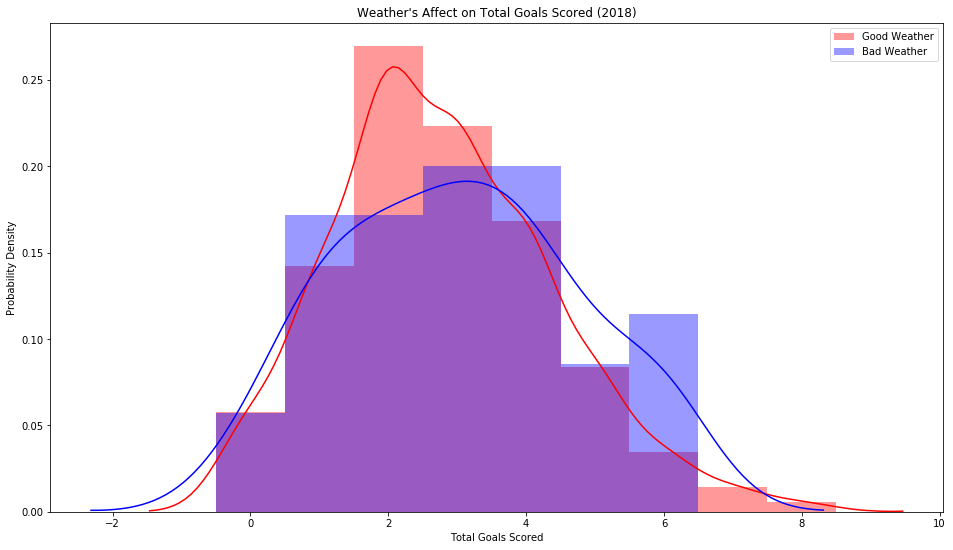

In [40]:
x = plot_statistic(good_weather, bad_weather, "Weather's Affect on Total Goals Scored (2018)")
x